# ANALYSE SCRNA-SEQ DATA FROM NTCU-MOUSE MODEL TRACHEA

In [1]:
# import modules needed for analysis
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib as mpl
from matplotlib import rcParams
import scrublet as scr
import scirpy
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

-----
anndata     0.9.1
scanpy      1.9.1
-----
Levenshtein                 NA
PIL                         9.5.0
adjustText                  NA
airr                        1.3.1
asttokens                   NA
backcall                    0.2.0
cairo                       1.23.0
cffi                        1.15.1
colorama                    0.4.6
comm                        0.1.3
cycler                      0.10.0
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.6.7
decorator                   5.1.1
defusedxml                  0.7.1
dill                        0.3.4
executing                   1.2.0
google                      NA
h5py                        3.8.0
igraph                      0.10.4
importlib_resources         NA
ipykernel                   6.23.0
ipython_genutils            0.2.0
ipywidgets                  7.6.5
jedi                        0.18.2
joblib                      1.2.0
jupyter_server              2.5.0
kiwisolver  

In [2]:
# determine path to save final result to 
results_file = '/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/NTCU_GEX_Trachea_processed.h5ad'  # the file that will store the analysis results

## READ IN THE DATA AND CHECK AT QC METRICES

In [3]:
adata_1 = sc.read_10x_h5('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_06d662cbe4721a21ee932058d5aa0286/per_sample_outs/cellranger700_multi_06d662cbe4721a21ee932058d5aa0286/count/sample_filtered_feature_bc_matrix.h5')                              # write a cache file for faster subsequent reading
adata_1.var_names_make_unique()
adata_1

# make some metadata
adata_1.obs['sample'] = "MD7176b_d"
adata_1.obs['patientID'] = "MD7176"
adata_1.obs['tissue'] = "Trachea"
adata_1.obs['phenotype'] = "NTCU-treated"
adata_1.obs['age'] = "21 weeks"

reading /lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_06d662cbe4721a21ee932058d5aa0286/per_sample_outs/cellranger700_multi_06d662cbe4721a21ee932058d5aa0286/count/sample_filtered_feature_bc_matrix.h5
 (0:00:05)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
scrub_1 = scr.Scrublet(
        counts_matrix=adata_1.X,
        expected_doublet_rate=0.1,  # Default is 0.1
        random_state=0)

# predict doublets
doublet_scores, predicted_doublets = scrub_1.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)


adata_1.obs['scrublet__predicted_multiplet'] = scrub_1.predicted_doublets_
adata_1.obs['scrublet__multiplet_scores'] = scrub_1.doublet_scores_obs_
adata_1.obs['scrublet__multiplet_zscores'] = scrub_1.z_scores_

# count the number of predicted multiplets
adata_1.obs['scrublet__predicted_multiplet'].value_counts() 

# remove predicted doublets
adata_1 = adata_1[adata_1.obs['scrublet__predicted_multiplet'] == False]

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.69
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 12.1 seconds


In [5]:
adata_2 = sc.read_10x_h5('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_2318721347829e44d53a34955b51ca53/per_sample_outs/cellranger700_multi_2318721347829e44d53a34955b51ca53/count/sample_filtered_feature_bc_matrix.h5')                              # write a cache file for faster subsequent reading
adata_2.var_names_make_unique()
adata_2

# make some metadata
adata_2.obs['sample'] = "MD7178b_d"
adata_2.obs['patientID'] = "MD7178"
adata_2.obs['tissue'] = "Trachea"
adata_2.obs['phenotype'] = "NTCU-treated"
adata_2.obs['age'] = "21 weeks"

reading /lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_2318721347829e44d53a34955b51ca53/per_sample_outs/cellranger700_multi_2318721347829e44d53a34955b51ca53/count/sample_filtered_feature_bc_matrix.h5
 (0:00:00)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [6]:
scrub_2 = scr.Scrublet(
        counts_matrix=adata_2.X,
        expected_doublet_rate=0.1,  # Default is 0.1
        random_state=0)

# predict doublets
doublet_scores, predicted_doublets = scrub_2.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)


adata_2.obs['scrublet__predicted_multiplet'] = scrub_2.predicted_doublets_
adata_2.obs['scrublet__multiplet_scores'] = scrub_2.doublet_scores_obs_
adata_2.obs['scrublet__multiplet_zscores'] = scrub_2.z_scores_

# count the number of predicted multiplets
adata_2.obs['scrublet__predicted_multiplet'].value_counts() 

# remove predicted doublets
adata_2 = adata_2[adata_2.obs['scrublet__predicted_multiplet'] == False]

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.59
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 0.8%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 10.5%
Elapsed time: 7.3 seconds


In [7]:
adata_3 = sc.read_10x_h5('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_aaef44c812f1e770141b5275f71d60ee/per_sample_outs/cellranger700_multi_aaef44c812f1e770141b5275f71d60ee/count/sample_filtered_feature_bc_matrix.h5')                              # write a cache file for faster subsequent reading
adata_3.var_names_make_unique()
adata_3

# make some metadata
adata_3.obs['sample'] = "MD7179b_d"
adata_3.obs['patientID'] = "MD7179"
adata_3.obs['tissue'] = "Trachea"
adata_3.obs['phenotype'] = "Control"
adata_3.obs['age'] = "21 weeks"

reading /lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_aaef44c812f1e770141b5275f71d60ee/per_sample_outs/cellranger700_multi_aaef44c812f1e770141b5275f71d60ee/count/sample_filtered_feature_bc_matrix.h5
 (0:00:00)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [8]:
scrub_3 = scr.Scrublet(
        counts_matrix=adata_3.X,
        expected_doublet_rate=0.1,  # Default is 0.1
        random_state=0)

# predict doublets
doublet_scores, predicted_doublets = scrub_3.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)


adata_3.obs['scrublet__predicted_multiplet'] = scrub_3.predicted_doublets_
adata_3.obs['scrublet__multiplet_scores'] = scrub_3.doublet_scores_obs_
adata_3.obs['scrublet__multiplet_zscores'] = scrub_3.z_scores_

# count the number of predicted multiplets
adata_3.obs['scrublet__predicted_multiplet'].value_counts() 

# remove predicted doublets
adata_3 = adata_3[adata_3.obs['scrublet__predicted_multiplet'] == False]

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.77
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.3%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 5.1%
Elapsed time: 8.5 seconds


In [9]:
adata_4 = sc.read_10x_h5('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_b0f792c3cdffa565115ba16baac3a356/per_sample_outs/cellranger700_multi_b0f792c3cdffa565115ba16baac3a356/count/sample_filtered_feature_bc_matrix.h5')                              # write a cache file for faster subsequent reading
adata_4.var_names_make_unique()
adata_4

# make some metadata
adata_4.obs['sample'] = "MD7177b_d"
adata_4.obs['patientID'] = "MD7177"
adata_4.obs['tissue'] = "Trachea"
adata_4.obs['phenotype'] = "NTCU-treated"
adata_4.obs['age'] = "21 weeks"

reading /lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_b0f792c3cdffa565115ba16baac3a356/per_sample_outs/cellranger700_multi_b0f792c3cdffa565115ba16baac3a356/count/sample_filtered_feature_bc_matrix.h5
 (0:00:00)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [10]:
scrub_4 = scr.Scrublet(
        counts_matrix=adata_4.X,
        expected_doublet_rate=0.1,  # Default is 0.1
        random_state=0)

# predict doublets
doublet_scores, predicted_doublets = scrub_4.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)


adata_4.obs['scrublet__predicted_multiplet'] = scrub_4.predicted_doublets_
adata_4.obs['scrublet__multiplet_scores'] = scrub_4.doublet_scores_obs_
adata_4.obs['scrublet__multiplet_zscores'] = scrub_4.z_scores_

# count the number of predicted multiplets
adata_4.obs['scrublet__predicted_multiplet'].value_counts() 

# remove predicted doublets
adata_4 = adata_4[adata_4.obs['scrublet__predicted_multiplet'] == False]

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.71
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.8%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 2.0%
Elapsed time: 7.1 seconds


In [11]:
adata_5 = sc.read_10x_h5('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_bdda4051f744f8b1a635646f6a312cdd/per_sample_outs/cellranger700_multi_bdda4051f744f8b1a635646f6a312cdd/count/sample_filtered_feature_bc_matrix.h5')                              # write a cache file for faster subsequent reading
adata_5.var_names_make_unique()
adata_5

# make some metadata
adata_5.obs['sample'] = "MD7216a_c"
adata_5.obs['patientID'] = "MD7216"
adata_5.obs['tissue'] = "Trachea"
adata_5.obs['phenotype'] = "NTCU-treated"
adata_5.obs['age'] = "30 weeks"

reading /lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_bdda4051f744f8b1a635646f6a312cdd/per_sample_outs/cellranger700_multi_bdda4051f744f8b1a635646f6a312cdd/count/sample_filtered_feature_bc_matrix.h5
 (0:00:00)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [12]:
scrub_5 = scr.Scrublet(
        counts_matrix=adata_5.X,
        expected_doublet_rate=0.1,  # Default is 0.1
        random_state=0)

# predict doublets
doublet_scores, predicted_doublets = scrub_5.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)


adata_5.obs['scrublet__predicted_multiplet'] = scrub_5.predicted_doublets_
adata_5.obs['scrublet__multiplet_scores'] = scrub_5.doublet_scores_obs_
adata_5.obs['scrublet__multiplet_zscores'] = scrub_5.z_scores_

# count the number of predicted multiplets
adata_5.obs['scrublet__predicted_multiplet'].value_counts() 

# remove predicted doublets
adata_5 = adata_5[adata_5.obs['scrublet__predicted_multiplet'] == False]

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.32
Detected doublet rate = 4.0%
Estimated detectable doublet fraction = 10.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 40.0%
Elapsed time: 0.2 seconds


In [13]:
adata_6 = sc.read_10x_h5('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_792c956a7489acafc5ba3fdf6b0c702b/per_sample_outs/cellranger700_multi_792c956a7489acafc5ba3fdf6b0c702b/count/sample_filtered_feature_bc_matrix.h5')                              # write a cache file for faster subsequent reading
adata_6.var_names_make_unique()
adata_6

# make some metadata
adata_6.obs['sample'] = "MD7217a_c"
adata_6.obs['patientID'] = "MD7217"
adata_6.obs['tissue'] = "Trachea"
adata_6.obs['phenotype'] = "NTCU-treated"
adata_6.obs['age'] = "30 weeks"

reading /lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_792c956a7489acafc5ba3fdf6b0c702b/per_sample_outs/cellranger700_multi_792c956a7489acafc5ba3fdf6b0c702b/count/sample_filtered_feature_bc_matrix.h5
 (0:00:00)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [14]:
scrub_6 = scr.Scrublet(
        counts_matrix=adata_6.X,
        expected_doublet_rate=0.1,  # Default is 0.1
        random_state=0)

# predict doublets
doublet_scores, predicted_doublets = scrub_6.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)


adata_6.obs['scrublet__predicted_multiplet'] = scrub_6.predicted_doublets_
adata_6.obs['scrublet__multiplet_scores'] = scrub_6.doublet_scores_obs_
adata_6.obs['scrublet__multiplet_zscores'] = scrub_6.z_scores_

# count the number of predicted multiplets
adata_6.obs['scrublet__predicted_multiplet'].value_counts() 

# remove predicted doublets
adata_6 = adata_6[adata_6.obs['scrublet__predicted_multiplet'] == False]

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.38
Detected doublet rate = 0.6%
Estimated detectable doublet fraction = 8.5%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 6.7%
Elapsed time: 0.3 seconds


In [15]:
adata_7 = sc.read_10x_h5('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_0142305efb8afa1472398ac0d51aedf4/per_sample_outs/cellranger700_multi_0142305efb8afa1472398ac0d51aedf4/count/sample_filtered_feature_bc_matrix.h5')                              # write a cache file for faster subsequent reading
adata_7.var_names_make_unique()
adata_7

# make some metadata
adata_7.obs['sample'] = "MD7218a_c"
adata_7.obs['patientID'] = "MD7218"
adata_7.obs['tissue'] = "Trachea"
adata_7.obs['phenotype'] = "NTCU-treated"
adata_7.obs['age'] = "30 weeks"

reading /lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_0142305efb8afa1472398ac0d51aedf4/per_sample_outs/cellranger700_multi_0142305efb8afa1472398ac0d51aedf4/count/sample_filtered_feature_bc_matrix.h5
 (0:00:00)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [16]:
scrub_7 = scr.Scrublet(
        counts_matrix=adata_7.X,
        expected_doublet_rate=0.1,  # Default is 0.1
        random_state=0)

# predict doublets
doublet_scores, predicted_doublets = scrub_7.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)


adata_7.obs['scrublet__predicted_multiplet'] = scrub_7.predicted_doublets_
adata_7.obs['scrublet__multiplet_scores'] = scrub_7.doublet_scores_obs_
adata_7.obs['scrublet__multiplet_zscores'] = scrub_7.z_scores_

# count the number of predicted multiplets
adata_7.obs['scrublet__predicted_multiplet'].value_counts() 

# remove predicted doublets
adata_7 = adata_7[adata_7.obs['scrublet__predicted_multiplet'] == False]

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.39
Detected doublet rate = 0.9%
Estimated detectable doublet fraction = 5.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 17.1%
Elapsed time: 0.3 seconds


In [17]:
adata_8 = sc.read_10x_h5('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_95fd2b2f029bc5370230f05e86779ae6/per_sample_outs/cellranger700_multi_95fd2b2f029bc5370230f05e86779ae6/count/sample_filtered_feature_bc_matrix.h5')                              # write a cache file for faster subsequent reading
adata_8.var_names_make_unique()
adata_8

# make some metadata
adata_8.obs['sample'] = "MD7219b_c"
adata_8.obs['patientID'] = "MD7219"
adata_8.obs['tissue'] = "Trachea"
adata_8.obs['phenotype'] = "Control"
adata_8.obs['age'] = "21 weeks"

reading /lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_95fd2b2f029bc5370230f05e86779ae6/per_sample_outs/cellranger700_multi_95fd2b2f029bc5370230f05e86779ae6/count/sample_filtered_feature_bc_matrix.h5
 (0:00:00)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [18]:
scrub_8 = scr.Scrublet(
        counts_matrix=adata_8.X,
        expected_doublet_rate=0.1,  # Default is 0.1
        random_state=0)

# predict doublets
doublet_scores, predicted_doublets = scrub_8.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)


adata_8.obs['scrublet__predicted_multiplet'] = scrub_8.predicted_doublets_
adata_8.obs['scrublet__multiplet_scores'] = scrub_8.doublet_scores_obs_
adata_8.obs['scrublet__multiplet_zscores'] = scrub_8.z_scores_

# count the number of predicted multiplets
adata_8.obs['scrublet__predicted_multiplet'].value_counts() 

# remove predicted doublets
adata_8 = adata_8[adata_8.obs['scrublet__predicted_multiplet'] == False]

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.38
Detected doublet rate = 1.4%
Estimated detectable doublet fraction = 8.5%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 16.9%
Elapsed time: 0.3 seconds


In [19]:
adata_9 = sc.read_10x_h5('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_0bed10957dd19cc33e73b71da1e438ca/per_sample_outs/cellranger700_multi_0bed10957dd19cc33e73b71da1e438ca/count/sample_filtered_feature_bc_matrix.h5')                              # write a cache file for faster subsequent reading
adata_9.var_names_make_unique()
adata_9

# make some metadata
adata_9.obs['sample'] = "MD7220b_c"
adata_9.obs['patientID'] = "MD7220"
adata_9.obs['tissue'] = "Trachea"
adata_9.obs['phenotype'] = "Control"
adata_9.obs['age'] = "30 weeks"

reading /lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_0bed10957dd19cc33e73b71da1e438ca/per_sample_outs/cellranger700_multi_0bed10957dd19cc33e73b71da1e438ca/count/sample_filtered_feature_bc_matrix.h5
 (0:00:00)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [20]:
scrub_9 = scr.Scrublet(
        counts_matrix=adata_9.X,
        expected_doublet_rate=0.1,  # Default is 0.1
        random_state=0)

# predict doublets
doublet_scores, predicted_doublets = scrub_9.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)


adata_9.obs['scrublet__predicted_multiplet'] = scrub_9.predicted_doublets_
adata_9.obs['scrublet__multiplet_scores'] = scrub_9.doublet_scores_obs_
adata_9.obs['scrublet__multiplet_zscores'] = scrub_9.z_scores_

# count the number of predicted multiplets
adata_9.obs['scrublet__predicted_multiplet'].value_counts() 

# remove predicted doublets
adata_9 = adata_9[adata_9.obs['scrublet__predicted_multiplet'] == False]

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.24
Detected doublet rate = 8.9%
Estimated detectable doublet fraction = 23.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 38.6%
Elapsed time: 0.2 seconds


In [21]:
adata_10 = sc.read_10x_h5('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_7c11411d3986b073c31f41640babf988/per_sample_outs/cellranger700_multi_7c11411d3986b073c31f41640babf988/count/sample_filtered_feature_bc_matrix.h5')                              # write a cache file for faster subsequent reading
adata_10.var_names_make_unique()
adata_10

# make some metadata
adata_10.obs['sample'] = "MD7221b_c"
adata_10.obs['patientID'] = "MD7221"
adata_10.obs['tissue'] = "Trachea"
adata_10.obs['phenotype'] = "Control"
adata_10.obs['age'] = "30 weeks"

reading /lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_7c11411d3986b073c31f41640babf988/per_sample_outs/cellranger700_multi_7c11411d3986b073c31f41640babf988/count/sample_filtered_feature_bc_matrix.h5
 (0:00:00)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [22]:
scrub_10 = scr.Scrublet(
        counts_matrix=adata_10.X,
        expected_doublet_rate=0.1,  # Default is 0.1
        random_state=0)

# predict doublets
doublet_scores, predicted_doublets = scrub_10.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)


adata_10.obs['scrublet__predicted_multiplet'] = scrub_10.predicted_doublets_
adata_10.obs['scrublet__multiplet_scores'] = scrub_10.doublet_scores_obs_
adata_10.obs['scrublet__multiplet_zscores'] = scrub_10.z_scores_

# count the number of predicted multiplets
adata_10.obs['scrublet__predicted_multiplet'].value_counts() 

# remove predicted doublets
adata_10 = adata_10[adata_10.obs['scrublet__predicted_multiplet'] == False]

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.32
Detected doublet rate = 1.6%
Estimated detectable doublet fraction = 5.6%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 28.6%
Elapsed time: 0.2 seconds


In [23]:
adata_11 = sc.read_10x_h5('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_81386faa269a8a1b112a54dbe404e64a/per_sample_outs/cellranger700_multi_81386faa269a8a1b112a54dbe404e64a/count/sample_filtered_feature_bc_matrix.h5')                              # write a cache file for faster subsequent reading
adata_11.var_names_make_unique()
adata_11

# make some metadata
adata_11.obs['sample'] = "MR7351b_c"
adata_11.obs['patientID'] = "MR7351"
adata_11.obs['tissue'] = "Trachea"
adata_11.obs['phenotype'] = "Control"
adata_11.obs['age'] = "30 weeks"

reading /lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_81386faa269a8a1b112a54dbe404e64a/per_sample_outs/cellranger700_multi_81386faa269a8a1b112a54dbe404e64a/count/sample_filtered_feature_bc_matrix.h5
 (0:00:00)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [24]:
scrub_11= scr.Scrublet(
        counts_matrix=adata_11.X,
        expected_doublet_rate=0.1,  # Default is 0.1
        random_state=0)

# predict doublets
doublet_scores, predicted_doublets = scrub_11.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)


adata_11.obs['scrublet__predicted_multiplet'] = scrub_11.predicted_doublets_
adata_11.obs['scrublet__multiplet_scores'] = scrub_11.doublet_scores_obs_
adata_11.obs['scrublet__multiplet_zscores'] = scrub_11.z_scores_

# count the number of predicted multiplets
adata_11.obs['scrublet__predicted_multiplet'].value_counts() 

# remove predicted doublets
adata_11 = adata_11[adata_11.obs['scrublet__predicted_multiplet'] == False]

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.64
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.4%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 7.8%
Elapsed time: 10.2 seconds


In [25]:
adata_12 = sc.read_10x_h5('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_a79067c4045f25e960c315ccd7aa78e0/per_sample_outs/cellranger700_multi_a79067c4045f25e960c315ccd7aa78e0/count/sample_filtered_feature_bc_matrix.h5')                              # write a cache file for faster subsequent reading
adata_12.var_names_make_unique()
adata_12

# make some metadata
adata_12.obs['sample'] = "MR7350b_c"
adata_12.obs['patientID'] = "MR7350"
adata_12.obs['tissue'] = "Trachea"
adata_12.obs['phenotype'] = "Control"
adata_12.obs['age'] = "30 weeks"

reading /lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_a79067c4045f25e960c315ccd7aa78e0/per_sample_outs/cellranger700_multi_a79067c4045f25e960c315ccd7aa78e0/count/sample_filtered_feature_bc_matrix.h5
 (0:00:00)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [26]:
scrub_12= scr.Scrublet(
        counts_matrix=adata_12.X,
        expected_doublet_rate=0.1,  # Default is 0.1
        random_state=0)

# predict doublets
doublet_scores, predicted_doublets = scrub_12.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)


adata_12.obs['scrublet__predicted_multiplet'] = scrub_12.predicted_doublets_
adata_12.obs['scrublet__multiplet_scores'] = scrub_12.doublet_scores_obs_
adata_12.obs['scrublet__multiplet_zscores'] = scrub_12.z_scores_

# count the number of predicted multiplets
adata_12.obs['scrublet__predicted_multiplet'].value_counts() 

# remove predicted doublets
adata_12 = adata_12[adata_12.obs['scrublet__predicted_multiplet'] == False]

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.76
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.4%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 10.3%
Elapsed time: 28.3 seconds


In [27]:
adata_13 = sc.read_10x_h5('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_c3146fceff922e5fce6d061c98636f09/per_sample_outs/cellranger700_multi_c3146fceff922e5fce6d061c98636f09/count/sample_filtered_feature_bc_matrix.h5')                              # write a cache file for faster subsequent reading
adata_13.var_names_make_unique()
adata_13

# make some metadata
adata_13.obs['sample'] = "MR7352b_c"
adata_13.obs['patientID'] = "MR7352"
adata_13.obs['tissue'] = "Trachea"
adata_13.obs['phenotype'] = "Control"
adata_13.obs['age'] = "21 weeks"

reading /lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_c3146fceff922e5fce6d061c98636f09/per_sample_outs/cellranger700_multi_c3146fceff922e5fce6d061c98636f09/count/sample_filtered_feature_bc_matrix.h5
 (0:00:01)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [28]:
scrub_13 = scr.Scrublet(
        counts_matrix=adata_13.X,
        expected_doublet_rate=0.1,  # Default is 0.1
        random_state=0)

# predict doublets
doublet_scores, predicted_doublets = scrub_13.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)


adata_13.obs['scrublet__predicted_multiplet'] = scrub_13.predicted_doublets_
adata_13.obs['scrublet__multiplet_scores'] = scrub_13.doublet_scores_obs_
adata_13.obs['scrublet__multiplet_zscores'] = scrub_13.z_scores_

# count the number of predicted multiplets
adata_13.obs['scrublet__predicted_multiplet'].value_counts() 

# remove predicted doublets
adata_13 = adata_13[adata_13.obs['scrublet__predicted_multiplet'] == False]

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.33
Detected doublet rate = 3.6%
Estimated detectable doublet fraction = 23.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 15.8%
Elapsed time: 39.3 seconds


In [29]:
adata_14 = sc.read_10x_h5('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_f7fac9965e5ed4cc6575fb3415c741d9/per_sample_outs/cellranger700_multi_f7fac9965e5ed4cc6575fb3415c741d9/count/sample_filtered_feature_bc_matrix.h5')                              # write a cache file for faster subsequent reading
adata_14.var_names_make_unique()
adata_14

# make some metadata
adata_14.obs['sample'] = "MR7353b_c"
adata_14.obs['patientID'] = "MR7353"
adata_14.obs['tissue'] = "Trachea"
adata_14.obs['phenotype'] = "NTCU-treated"
adata_14.obs['age'] = "30 weeks"

reading /lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/cellranger700_multi_f7fac9965e5ed4cc6575fb3415c741d9/per_sample_outs/cellranger700_multi_f7fac9965e5ed4cc6575fb3415c741d9/count/sample_filtered_feature_bc_matrix.h5
 (0:00:00)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [30]:
scrub_14 = scr.Scrublet(
        counts_matrix=adata_14.X,
        expected_doublet_rate=0.1,  # Default is 0.1
        random_state=0)

# predict doublets
doublet_scores, predicted_doublets = scrub_14.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)


adata_14.obs['scrublet__predicted_multiplet'] = scrub_14.predicted_doublets_
adata_14.obs['scrublet__multiplet_scores'] = scrub_14.doublet_scores_obs_
adata_14.obs['scrublet__multiplet_zscores'] = scrub_14.z_scores_

# count the number of predicted multiplets
adata_14.obs['scrublet__predicted_multiplet'].value_counts() 

# remove predicted doublets
adata_14 = adata_14[adata_14.obs['scrublet__predicted_multiplet'] == False]

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.67
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 32.6 seconds


In [31]:
# Merge all individual samples together
adata = adata_1.concatenate([adata_2,adata_3, adata_4, adata_5, adata_6, adata_7, adata_8, adata_9, adata_10, adata_11, adata_12, adata_13, adata_14], join="outer")
adata.obs

/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


,sample,patientID,tissue,phenotype,age,scrublet__predicted_multiplet,scrublet__multiplet_scores,scrublet__multiplet_zscores,batch
AAACCTGAGACAGGCT-1-0,MD7176b_d,MD7176,Trachea,NTCU-treated,21 weeks,False,0.027316,-87.598982,0
AAACCTGAGCTACCTA-1-0,MD7176b_d,MD7176,Trachea,NTCU-treated,21 weeks,False,0.057971,-41.537284,0
AAACCTGAGTAGATGT-1-0,MD7176b_d,MD7176,Trachea,NTCU-treated,21 weeks,False,0.101996,-22.512209,0
AAACCTGCAAGACACG-1-0,MD7176b_d,MD7176,Trachea,NTCU-treated,21 weeks,False,0.049107,-49.267140,0
AAACCTGCAAGGTTTC-1-0,MD7176b_d,MD7176,Trachea,NTCU-treated,21 weeks,False,0.184564,-10.956832,0
...,...,...,...,...,...,...,...,...,...
TTTGTCATCACATAGC-1-13,MR7353b_c,MR7353,Trachea,NTCU-treated,30 weeks,False,0.051471,-47.207327,13
TTTGTCATCAGTCCCT-1-13,MR7353b_c,MR7353,Trachea,NTCU-treated,30 weeks,False,0.067227,-35.725372,13
TTTGTCATCCGAGCCA-1-13,MR7353b_c,MR7353,Trachea,NTCU-treated,30 weeks,False,0.101604,-22.736989,13
TTTGTCATCCTAGGGC-1-13,MR7353b_c,MR7353,Trachea,NTCU-treated,30 weeks,False,0.086221,-27.305090,13


In [32]:
adata

AnnData object with n_obs × n_vars = 70342 × 32285
    obs: 'sample', 'patientID', 'tissue', 'phenotype', 'age', 'scrublet__predicted_multiplet', 'scrublet__multiplet_scores', 'scrublet__multiplet_zscores', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'

## PERFORM INITIAL QC FILTERING

In [ ]:
# preprocessing
sc.pl.highest_expr_genes(adata, n_top=20)

In [34]:
# basic filtering
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 4484 cells that have less than 200 genes expressed
filtered out 7227 genes that are detected in less than 3 cells


In [35]:
# calculate some quality metrics as for instance mitochondrial percentage
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, inplace=True)

# and for ribosomal genes
adata.var['ribo'] = adata.var_names.str.startswith(('Rps','Rpl'))  # annotate the group of ribosomal genes as 'ribo'
sc.pp.calculate_qc_metrics(adata, qc_vars=['ribo'], percent_top=None, inplace=True)

In [ ]:
# visualize some QC metrics
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'], jitter=0.4, multi_panel=True)

In [ ]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [38]:
# do the actual filtering by slicing the object
adata = adata[1000 < adata.obs.n_genes_by_counts, :]
adata = adata[adata.obs.n_genes_by_counts < 6000, :]
adata = adata[500 < adata.obs.total_counts, :]
adata = adata[adata.obs.total_counts < 35000, :]
adata = adata[adata.obs.pct_counts_mt < 10, :]

In [39]:
# check the mean number of genes and counts
mean_counts = adata.obs['total_counts'].mean()
mean_genes = adata.obs['n_genes'].mean()
mean_mt = adata.obs['pct_counts_mt'].mean()
mean_ribo = adata.obs['pct_counts_ribo'].mean()
print(mean_counts)
print(mean_mt)
print(mean_ribo)
print(mean_genes)

10239.114
3.2365847
14.561736
3005.990468473463


In [40]:
min_counts = adata.obs['total_counts'].min()
max_counts = adata.obs['total_counts'].max()
print(min_counts)
print(max_counts)

1373.0
34963.0


In [41]:
min_genes = adata.obs['n_genes'].min()
max_genes = adata.obs['n_genes'].max()
print(min_genes)
print(max_genes)

1001
5999


In [42]:
# save the raw data at this point
adata.write('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/NTCU_GEX_Trachea_raw.h5ad')

## PERFORM NORMALIZATION AND PCA

In [43]:
sc.pp.normalize_total(adata, target_sum=1e4)

/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


In [44]:
sc.pp.log1p(adata)

In [45]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [ ]:
sc.pl.highly_variable_genes(adata)

In [47]:
# set the raw attribute of anndata
adata.raw = adata

In [48]:
adata = adata[:, adata.var.highly_variable]

In [49]:
# regress out effects of total counts per cell and the percentage of mitochondrial genes
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt', 'pct_counts_ribo'])

regressing out ['total_counts', 'pct_counts_mt', 'pct_counts_ribo']
    sparse input is densified and may lead to high memory use
    finished (0:02:14)


In [50]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:24)


In [ ]:
sc.pl.pca_variance_ratio(adata, log=True)

In [52]:
# compute nearest neighbors, UMAP and clustering
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=10)
sc.tl.umap(adata,
            n_components=2,
            min_dist=0.1,  # Scanpy default = 0.05
            spread=1.0,  # Scanpy default = 1.0

            # For some reason cannot access neighbors key slot, thus we
            # must keep uns['neighbors'] until we have run this.
            # neighbors_key='neighbors__{}'.format(plt__label),
            copy=False,
            random_state=0
        )
sc.tl.leiden(adata, resolution= 1.0)

computing neighbors
    using 'X_pca' with n_pcs = 10
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:20)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:30)
running Leiden clustering
    finished: found 30 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:09)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


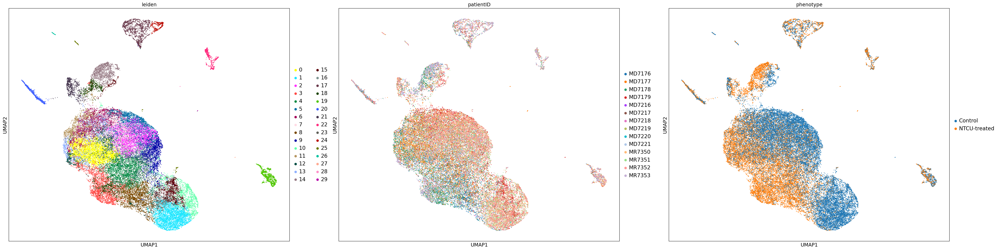

In [53]:
with mpl.rc_context({'figure.figsize': [15, 12],
                     'axes.facecolor': 'white'}):
    sc.pl.umap(adata, color=['leiden', 'patientID', 'phenotype'], size=12,
               color_map = 'RdPu', ncols = 3,
               legend_fontsize=15, save = "_NTCU_Trachea_clusters_tissue_mouse.pdf")

## CHECK MARKER GENES OF INTEREST 

In [ ]:
# visualise marker genes from GuoEtal2019, Nature Communications
guoEtal_celltype_genes = ['Krt5', 'Bcam', 'Aqp3', 'Wnt4', 'Trp63', 'Krt15', 
                          'Scgb1a1', 'Scgb3a1', 'Sftpd', 'Bpifb1', 'Sftpa1', 'Muc1', 'Scgb3a2', 'Muc5b',
                          'Muc4', 'Muc16',
                          'Il1b', 'Csf3r',
                          'Itk', 'Skap1', 'Lck', 'Cd3e', 'Cd3d', 
                          'Gstm1', 'Gstm2', 'Prdx1', 'Scgb3a2',
                          'Dnah12', 'Dnah5', 'Cfap44', 'Cfap61',
                          'Gngt2', 'Cst3', 'Fcer1g', 'Ace',
                          'Eng', 'Flt1', 'Egfl7', 'Pecam1',
                          'H2afz', 'Ptma', 'Stmn1', 'Hmgb2', 'Hmgn2', 'Ptn', 'Epcam', 'Ect2',
                          'Alox5ap', 'Ctss', 'Npc2', 'Mpeg1', 'Tyrobp',
                          'Adgrf5', 'Ramp2', 'Epas1', 'Egfl7',
                          'Il7r', 'Cxcr6', 'Cd3g', 'Cd3e', 'Icos', 'Il2ra',
                          'Mpeg1', 'Cd68',
                          'Cd74', 'Cd79a', 'Mef2c', 'H2-Aa',
                          'Clec3b', 'Mgp', 'Mxra8', 'Sparc', 'Inmt', 'Pcolce2',
                          'Cadm1', 'Siglech', 'Blnk', 'Irf8',
                          'Cftr'] 

sc.pl.dotplot(adata, guoEtal_celltype_genes, groupby='leiden', standard_scale='var', return_fig=True).style(grid=True, cmap='Blues', color_on='dot').swap_axes(swap_axes=False).savefig("NTCU_Trachea_leiden_GuoEtal2019_MarkerGenes.pdf")

In [55]:
# save the results at this point
adata.write(results_file)

## TAKE THE EPITHELIAL CELLS AND SUBCLUSTER FURTHER

In [56]:
# analysis can be restarted here
# adata = sc.read(results_file)

/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


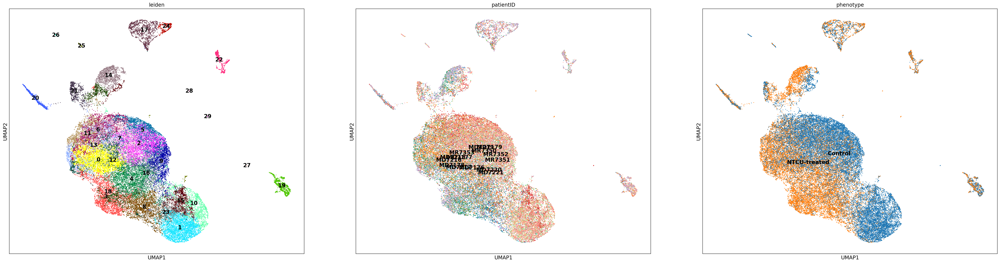

In [57]:
with mpl.rc_context({'figure.figsize': [15, 12],
                     'axes.facecolor': 'white'}):
    sc.pl.umap(adata, color=['leiden', 'patientID', 'phenotype'], size=12,
               color_map = 'RdPu', ncols = 3, legend_loc='on data',
               legend_fontsize=15, save = "_NTCU_Trachea_clusters_UMAP_on_data.pdf")

In [58]:
# assign overall cell types to each cluster for further subtype analysis
new_cluster_names = ['cluster0', 'cluster1', 'cluster2', 'cluster3', 'cluster4', 'cluster5', 'cluster6','cluster7', 
                     'cluster8', 'cluster9', 'cluster10', 'cluster11', 'cluster12', 'cluster13', 'cluster14','cluster15',
                     'cluster16', 'cluster17', 'cluster18', 'cluster19', 'cluster20', 'cluster21', 'cluster22',
                     'cluster23', 'cluster24', 'cluster25', 'cluster26', 'cluster27', 'cluster28', 'cluster29']
adata.rename_categories('leiden', new_cluster_names)

old_to_new = dict(
    cluster0='Epithelial cells',
    cluster1='Epithelial cells',
    cluster2='Epithelial cells',
    cluster3='Epithelial cells',
    cluster4='Epithelial cells',
    cluster5='Epithelial cells',
    cluster6='Epithelial cells',
    cluster7='Epithelial cells',
    cluster8='Epithelial cells',
    cluster9='Epithelial cells',
    cluster10='Epithelial cells',
    cluster11='Epithelial cells',
    cluster12='Epithelial cells',
    cluster13='Epithelial cells',
    cluster14='Epithelial cells',
    cluster15='Epithelial cells',
    cluster16='Epithelial cells',
    cluster17='Epithelial cells',
    cluster18='Epithelial cells',
    cluster19='T cells',
    cluster20='Epithelial cells',
    cluster21='Epithelial cells',
    cluster22='Macrophages',
    cluster23='Epithelial cells',
    cluster24='Epithelial cells',
    cluster25='Epithelial cells',
    cluster26='Epithelial cells',
    cluster27='Epithelial cells',
    cluster28='Epithelial cells',
    cluster29='Epithelial cells'
)
  
adata.obs['Cell_types'] = (
    adata.obs['leiden']
    .map(old_to_new)
    .astype('category')
)


/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


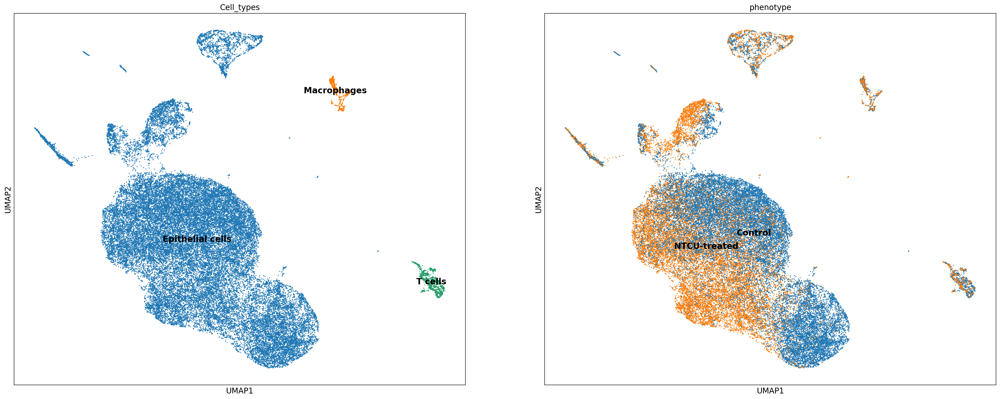

In [59]:
with mpl.rc_context({'figure.figsize': [15, 12],
                     'axes.facecolor': 'white'}):
    sc.pl.umap(adata, color=['Cell_types', 'phenotype'], size=12,
               color_map = 'RdPu', ncols = 4, legend_loc='on data',
               legend_fontsize=15, save = "_NTCU_Celltype_Trachea_UMAP_on_data.pdf")

In [ ]:
with mpl.rc_context({'figure.figsize': [15, 12],
                     'axes.facecolor': 'white'}):
    sc.pl.umap(adata, color=['patientID', 'age'], size=12,
               color_map = 'RdPu', ncols = 2,
               legend_fontsize=15, save = "_NTCU_MouseID_Age_Trachea_UMAP_on_data.pdf")

/software/team152/mp34/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


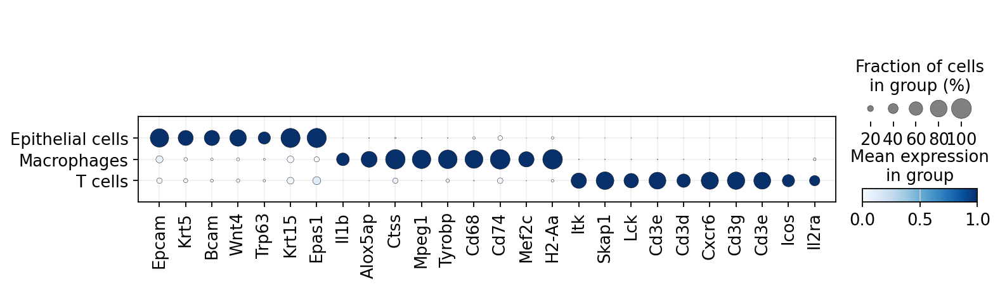

In [61]:
# visualise marker genes for the high-level celltypes
high_level_celltype_genes = ['Epcam', 'Krt5', 'Bcam', 'Wnt4', 'Trp63', 'Krt15', 'Epas1',
                          'Il1b', 'Alox5ap', 'Ctss', 'Mpeg1', 'Tyrobp', 'Cd68', 'Cd74', 'Mef2c', 'H2-Aa',
                          'Itk', 'Skap1', 'Lck', 'Cd3e', 'Cd3d', 'Cxcr6', 'Cd3g', 'Cd3e', 'Icos', 'Il2ra'] 

sc.pl.dotplot(adata, high_level_celltype_genes, groupby='Cell_types', standard_scale='var', return_fig=True).style(grid=True, cmap='Blues', color_on='dot').swap_axes(swap_axes=False).savefig("NTCU_Trachea_HighLevel_Celltypes.pdf")

In [62]:
# save the results at this point
adata.write('/lustre/scratch126/casm/team154pc/mp34/lung/NTCU/scRNA/NTCU_GEX_Trachea_processed_Celltype.h5ad')